In [30]:
import pandas as pd 
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import train_test_split, StratifiedKFold
import numpy as np 
from sklearn.metrics import log_loss, accuracy_score, f1_score, precision_score, recall_score, classification_report
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt

In [21]:
# HR_comma_sep.csv
df = pd.read_csv("../cases/human-resources-analytics/HR_comma_sep.csv")
dum_hr = pd.get_dummies(df, drop_first=True)

y = dum_hr['left']
X = dum_hr.drop('left', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.3,
                                                    random_state=42,
                                                    stratify=y)

kfold = StratifiedKFold(n_splits=5, shuffle=True,random_state=42)

### Decision Tree Classifier

In [22]:
dtc = DecisionTreeClassifier()

param_grid = {
   'criterion': ['gini', 'entropy'],
   'splitter': ['best', 'random'],
   'max_depth': [None, 5, 10, 15, 20],
   'min_samples_split': [2, 5, 10],
   'min_samples_leaf': [1, 2, 4],
   'random_state': [42]
}

gcv = GridSearchCV(dtc, param_grid, cv=5, scoring='accuracy')
gcv.fit(X, y)

print(gcv.best_params_)
print(gcv.best_score_)

{'criterion': 'gini', 'max_depth': 10, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 42, 'splitter': 'best'}
0.9785630799246807


/home/dai/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
900 fits failed out of a total of 3600.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
900 fits failed with the following error:
Traceback (most recent call last):
  File "/home/dai/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/dai/anaconda3/lib/python3.11/site-packages/sklearn/base.py", line 1144, in wrapper
    estimator._validate_params()
  File "/home/dai/anaconda3/lib/python3.11/site-packages/sklearn/base.py", line 637, in _validate_params
    validate_parameter_constraints(
  File "/home/dai/anaco

In [23]:
bm = gcv.best_estimator_
y_pred = bm.predict(X_test)
print("Log Loss: ", log_loss(y_test, y_pred))
print("Accuracy Score: ", accuracy_score(y_test, y_pred))

Log Loss:  0.7290447784862552
Accuracy Score:  0.979773282951767


In [24]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))

Accuracy: 0.979773282951767
Precision: 0.9675262655205349
Recall: 0.9467289719626168
F1 Score: 0.9570146433632499


In [25]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      3429
           1       0.97      0.95      0.96      1070

    accuracy                           0.98      4499
   macro avg       0.98      0.97      0.97      4499
weighted avg       0.98      0.98      0.98      4499



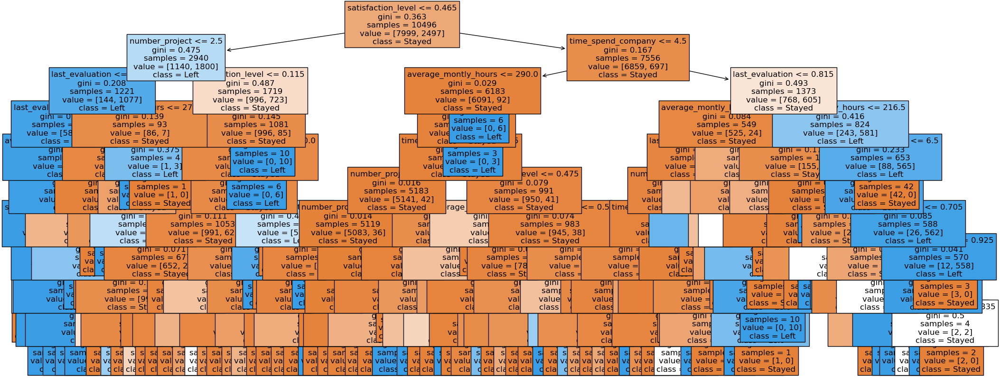

In [26]:
#### Creating a graphical view of tree
plt.figure(figsize=(25,10))
plot_tree(bm,feature_names=bm.feature_names_in_.tolist(),
               class_names=['Stayed','Left'],
               filled=True,fontsize=12) 
plt.show()

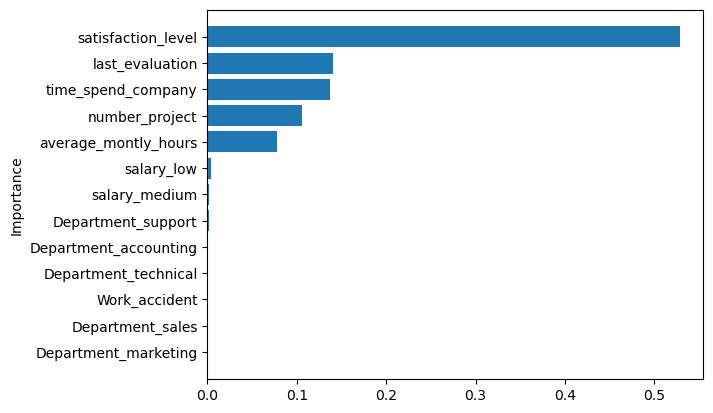

In [27]:
df_imp = pd.DataFrame({ 'variable':bm.feature_names_in_,
                        'importance':bm.feature_importances_})

df_imp = df_imp[df_imp['importance']>0.0001]
df_imp = df_imp.sort_values(by='importance')
plt.barh(df_imp['variable'] ,df_imp['importance'])
plt.ylabel("Importance")
plt.show()

### Random Forest Classifier

In [32]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
param_grid = {
  'n_estimators': [50, 100, 200],
  'max_depth': [None, 5, 10, 15, 20],
  'min_samples_split': [2, 5, 10],
  'min_samples_leaf': [1, 2, 4],
  'bootstrap': [True, False],
  'random_state': [42]
}

gcv_rf = RandomizedSearchCV(rf, param_distributions=param_grid, scoring='neg_log_loss', cv=kfold, verbose=3)
gcv_rf.fit(X, y)
print(gcv_rf.best_params_)
print(gcv_rf.best_score_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END bootstrap=False, max_depth=15, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42;, score=-0.063 total time=   1.1s
[CV 2/5] END bootstrap=False, max_depth=15, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42;, score=-0.065 total time=   1.2s
[CV 3/5] END bootstrap=False, max_depth=15, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42;, score=-0.063 total time=   1.2s
[CV 4/5] END bootstrap=False, max_depth=15, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42;, score=-0.061 total time=   1.2s
[CV 5/5] END bootstrap=False, max_depth=15, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42;, score=-0.065 total time=   1.2s
[CV 1/5] END bootstrap=False, max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42;, score=-0.087 total time=   0.6s
[CV 2/5] END bo

In [34]:
bm_rf = gcv_rf.best_estimator_
y_pred = bm_rf.predict(X_test)
print("Log Loss: ", log_loss(y_test, y_pred))
print("Accuracy Score: ", accuracy_score(y_test, y_pred))

Log Loss:  0.20028702705666368
Accuracy Score:  0.9944432096021338


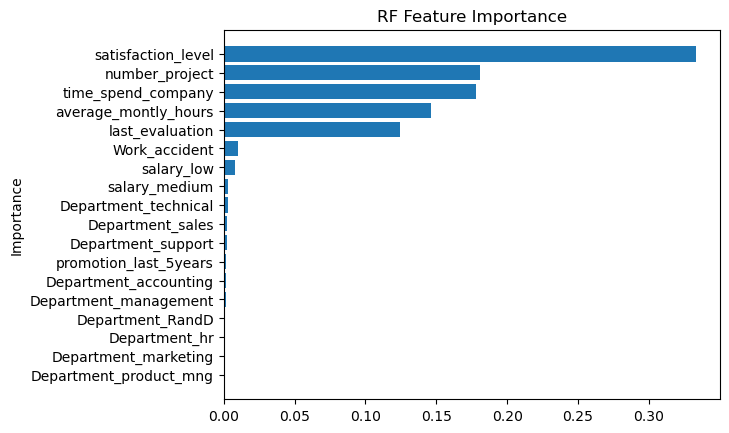

In [35]:
df_imp = pd.DataFrame({ 'variable':bm_rf.feature_names_in_,
                        'importance':bm_rf.feature_importances_})

df_imp = df_imp[df_imp['importance']>0.0001]
df_imp = df_imp.sort_values(by='importance')
plt.barh(df_imp['variable'] ,df_imp['importance'])
plt.title("RF Feature Importance")
plt.ylabel("Importance")
plt.show()

### AdaBoost Classifier

In [36]:
from sklearn.ensemble import AdaBoostClassifier

adc = AdaBoostClassifier()

param_grid_adc = {
    'n_estimators': [50, 100, 200],
    'learning_rate': np.linspace(0.001, 0.999, 10)
}

gcv_adc = GridSearchCV(adc, param_grid=param_grid_adc, cv=kfold, scoring='neg_log_loss', verbose=3)
gcv_adc.fit(X, y)
print(gcv_adc.best_params_)
print(gcv_adc.best_score_)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
[CV 1/5] END learning_rate=0.001, n_estimators=50;, score=-0.413 total time=   0.5s
[CV 2/5] END learning_rate=0.001, n_estimators=50;, score=-0.401 total time=   0.5s
[CV 3/5] END learning_rate=0.001, n_estimators=50;, score=-0.417 total time=   0.5s
[CV 4/5] END learning_rate=0.001, n_estimators=50;, score=-0.424 total time=   0.4s
[CV 5/5] END learning_rate=0.001, n_estimators=50;, score=-0.422 total time=   0.5s
[CV 1/5] END learning_rate=0.001, n_estimators=100;, score=-0.413 total time=   0.9s
[CV 2/5] END learning_rate=0.001, n_estimators=100;, score=-0.402 total time=   0.9s
[CV 3/5] END learning_rate=0.001, n_estimators=100;, score=-0.417 total time=   0.9s
[CV 4/5] END learning_rate=0.001, n_estimators=100;, score=-0.424 total time=   0.9s
[CV 5/5] END learning_rate=0.001, n_estimators=100;, score=-0.423 total time=   0.9s
[CV 1/5] END learning_rate=0.001, n_estimators=200;, score=-0.415 total time=   1.8s
[CV 2/5]

In [37]:
bm_adc = gcv_adc.best_estimator_
y_pred = bm_adc.predict(X_test)
print("Log Loss: ", log_loss(y_test, y_pred))
print("Accuracy Score: ", accuracy_score(y_test, y_pred))

Log Loss:  6.841804844255623
Accuracy Score:  0.8101800400088909


### Gradient Boosting Classifier

In [38]:
from sklearn.ensemble import GradientBoostingClassifier

gbc = GradientBoostingClassifier()

param_grid_gbc = {
    'learning_rate': np.linspace(0.001, 0.999, 10),
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 5, 10, 15, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'random_state': [42]
}

gcv_gbc = RandomizedSearchCV(gbc, param_grid_gbc, cv=kfold, scoring='neg_log_loss', verbose=3)
gcv_gbc.fit(X, y)
print(gcv_gbc.best_params_)
print(gcv_gbc.best_score_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END learning_rate=0.7772222222222221, max_depth=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42;, score=-0.130 total time=   3.3s
[CV 2/5] END learning_rate=0.7772222222222221, max_depth=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42;, score=-0.174 total time=   3.0s
[CV 3/5] END learning_rate=0.7772222222222221, max_depth=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42;, score=-0.142 total time=   2.9s
[CV 4/5] END learning_rate=0.7772222222222221, max_depth=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42;, score=-0.112 total time=   3.0s
[CV 5/5] END learning_rate=0.7772222222222221, max_depth=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42;, score=-0.144 total time=   3.0s
[CV 1/5] END learning_rate=0.001, max_depth=20, min_samples_leaf=2, min_samples

In [40]:
bm_gbc = gcv_gbc.best_estimator_
y_pred = bm_gbc.predict(X_test)
print("Log Loss: ", log_loss(y_test, y_pred))
print("Accuracy Score: ", accuracy_score(y_test, y_pred))

Log Loss:  0.1682411027275975
Accuracy Score:  0.9953322960657924


### XG Boost Classifier

In [42]:
from xgboost import XGBClassifier

xgbm = XGBClassifier(random_state=42)
params = {
   'n_estimators': [50, 100, 200],
   'max_depth': [None, 5, 10, 15, 20],
   'min_child_weight': [1, 5, 10],
   'gamma': [0, 0.5, 1],
   'subsample': [0.6, 0.8, 1.0],
   'colsample_bytree': [0.6, 0.8, 1.0],
   'reg_alpha': [0, 0.1, 1],
   'reg_lambda': [0, 0.1, 1],
   'learning_rate': [0.01, 0.1, 0.2],
   'scale_pos_weight': [1, 50, 100]
}

gcv_xgbm = RandomizedSearchCV(xgbm, params,verbose=3, cv=kfold, scoring='neg_log_loss')
gcv_xgbm.fit(X, y)
print(gcv_xgbm.best_params_)
print(gcv_xgbm.best_score_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END colsample_bytree=1.0, gamma=0.5, learning_rate=0.2, max_depth=10, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1, scale_pos_weight=1, subsample=0.8;, score=-0.064 total time=   0.9s
[CV 2/5] END colsample_bytree=1.0, gamma=0.5, learning_rate=0.2, max_depth=10, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1, scale_pos_weight=1, subsample=0.8;, score=-0.073 total time=   0.3s
[CV 3/5] END colsample_bytree=1.0, gamma=0.5, learning_rate=0.2, max_depth=10, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1, scale_pos_weight=1, subsample=0.8;, score=-0.063 total time=   0.4s
[CV 4/5] END colsample_bytree=1.0, gamma=0.5, learning_rate=0.2, max_depth=10, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1, scale_pos_weight=1, subsample=0.8;, score=-0.064 total time=   0.4s
[CV 5/5] END colsample_bytree=1.0, gamma=0.5, learning_rate=0.2, max_depth=10, 

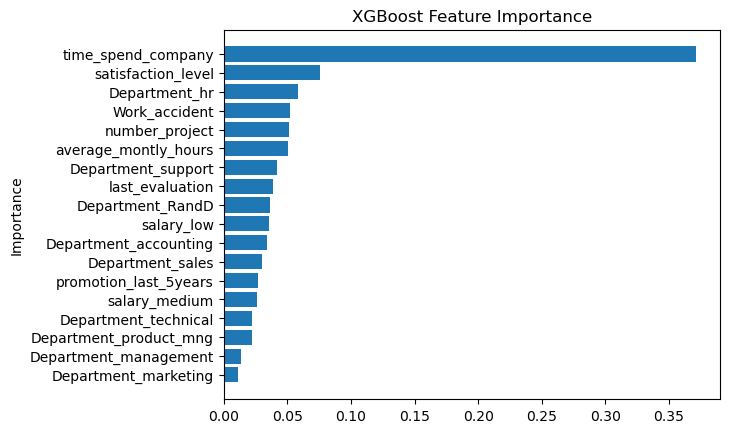

In [43]:
bm_xgbm = gcv_xgbm.best_estimator_

df_imp = pd.DataFrame({ 'variable':bm_xgbm.feature_names_in_,
                        'importance':bm_xgbm.feature_importances_})

df_imp = df_imp[df_imp['importance']>0.0001]
df_imp = df_imp.sort_values(by='importance')
plt.barh(df_imp['variable'] ,df_imp['importance'])
plt.title("XGBoost Feature Importance")
plt.ylabel("Importance")
plt.show()

In [44]:
bm_xgbc = gcv_xgbm.best_estimator_
y_pred = bm_xgbc.predict(X_test)
print("Log Loss: ", log_loss(y_test, y_pred))
print("Accuracy Score: ", accuracy_score(y_test, y_pred))

Log Loss:  0.05608036757586599
Accuracy Score:  0.9984440986885975


### Light GBM

In [45]:
from lightgbm import LGBMClassifier
lgbm = LGBMClassifier(random_state=23)
params = {'max_depth': [2,3,4,5,6,None],
          'learning_rate':np.linspace(0.001, 0.999, 10),
          'n_estimators':[50, 100, 150]}

gcv_lgbm = GridSearchCV(lgbm, param_grid=params,verbose=3, cv=kfold, scoring='neg_log_loss')
gcv_lgbm.fit(X, y)
print(gcv_lgbm.best_params_)
print(gcv_lgbm.best_score_)

Fitting 5 folds for each of 180 candidates, totalling 900 fits
[LightGBM] [Info] Number of positive: 2853, number of negative: 9143
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 417
[LightGBM] [Info] Number of data points in the train set: 11996, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.237829 -> initscore=-1.164617
[LightGBM] [Info] Start training from score -1.164617
[CV 1/5] END learning_rate=0.001, max_depth=2, n_estimators=50;, score=-0.526 total time=   0.2s
[LightGBM] [Info] Number of positive: 2853, number of negative: 9143
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 417
[LightGBM] [Info] Num

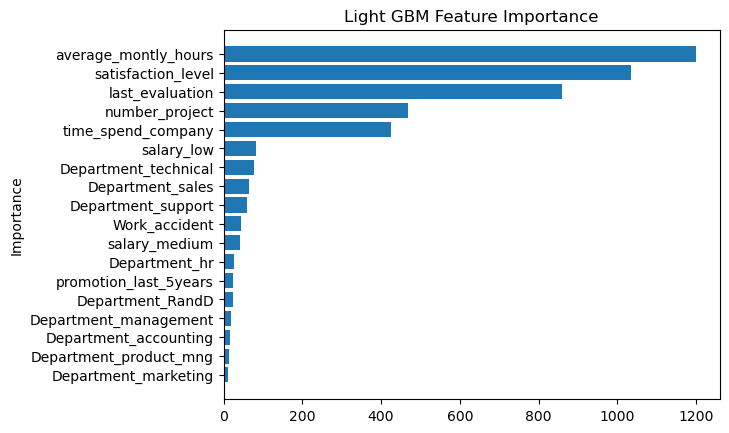

In [46]:
bm_lgbm = gcv_lgbm.best_estimator_

df_imp = pd.DataFrame({ 'variable':bm_lgbm.feature_name_,
                        'importance':bm_lgbm.feature_importances_})

df_imp = df_imp[df_imp['importance']>0.0001]
df_imp = df_imp.sort_values(by='importance')
plt.barh(df_imp['variable'] ,df_imp['importance'])
plt.title("Light GBM Feature Importance")
plt.ylabel("Importance")
plt.show()

In [47]:
bm_lgbm = gcv_lgbm.best_estimator_
y_pred = bm_lgbm.predict(X_test)
print("Log Loss: ", log_loss(y_test, y_pred))
print("Accuracy Score: ", accuracy_score(y_test, y_pred))

Log Loss:  0.09613777298719868
Accuracy Score:  0.9973327406090242


### Cat Boost

In [48]:
from catboost import CatBoostClassifier
cgbm = CatBoostClassifier(random_state=23)
params = {'max_depth': [2,3,4,5,6,None],
          'learning_rate':np.linspace(0.001, 0.999, 10),
          'n_estimators':[50, 100, 150]}

gcv_cgbm = GridSearchCV(cgbm, param_grid=params,verbose=3, cv=kfold, scoring='neg_log_loss')
gcv_cgbm.fit(X, y)
print(gcv_cgbm.best_params_)
print(gcv_cgbm.best_score_)

Fitting 5 folds for each of 180 candidates, totalling 900 fits
0:	learn: 0.6925324	total: 58ms	remaining: 2.84s
1:	learn: 0.6919176	total: 60.5ms	remaining: 1.45s
2:	learn: 0.6913038	total: 62.9ms	remaining: 985ms
3:	learn: 0.6906940	total: 65ms	remaining: 747ms
4:	learn: 0.6900823	total: 66.9ms	remaining: 602ms
5:	learn: 0.6894758	total: 69ms	remaining: 506ms
6:	learn: 0.6888816	total: 71.4ms	remaining: 439ms
7:	learn: 0.6882724	total: 73.2ms	remaining: 384ms
8:	learn: 0.6876649	total: 74.8ms	remaining: 341ms
9:	learn: 0.6870643	total: 76.2ms	remaining: 305ms
10:	learn: 0.6864609	total: 77.8ms	remaining: 276ms
11:	learn: 0.6858631	total: 79.3ms	remaining: 251ms
12:	learn: 0.6852587	total: 80.9ms	remaining: 230ms
13:	learn: 0.6846623	total: 82.4ms	remaining: 212ms
14:	learn: 0.6840651	total: 83.6ms	remaining: 195ms
15:	learn: 0.6834676	total: 84.7ms	remaining: 180ms
16:	learn: 0.6828692	total: 86ms	remaining: 167ms
17:	learn: 0.6822718	total: 87.1ms	remaining: 155ms
18:	learn: 0.681676

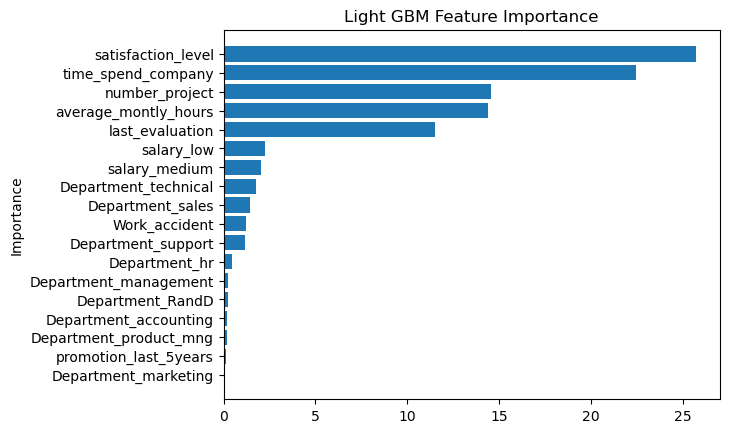

In [49]:
bm_cgbm = gcv_cgbm.best_estimator_

df_imp = pd.DataFrame({ 'variable':bm_cgbm.feature_names_,
                        'importance':bm_cgbm.feature_importances_})

df_imp = df_imp[df_imp['importance']>0.0001]
df_imp = df_imp.sort_values(by='importance')
plt.barh(df_imp['variable'] ,df_imp['importance'])
plt.title("Light GBM Feature Importance")
plt.ylabel("Importance")
plt.show()

In [50]:
bm_cgbm = gcv_cgbm.best_estimator_
y_pred = bm_cgbm.predict(X_test)
print("Log Loss: ", log_loss(y_test, y_pred))
print("Accuracy Score: ", accuracy_score(y_test, y_pred))

Log Loss:  0.22432147030346328
Accuracy Score:  0.9937763947543898
